# Loan Prediction Dataset: Pipeline de Machine Learning con LightGBM

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, balanced_accuracy_score
from lightgbm import LGBMClassifier
from imblearn.over_sampling import SMOTE

# Cargar datos
url = 'https://raw.githubusercontent.com/shrikant-temburwar/Loan-Prediction-Dataset/refs/heads/master/train.csv'
data = pd.read_csv(url)

# Mostrar estructura del dataset
print("Información del dataset:")
print(data.info())
print("\nPrimeras filas del dataset:")
print(data.head())


Información del dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Loan_ID            614 non-null    object 
 1   Gender             601 non-null    object 
 2   Married            611 non-null    object 
 3   Dependents         599 non-null    object 
 4   Education          614 non-null    object 
 5   Self_Employed      582 non-null    object 
 6   ApplicantIncome    614 non-null    int64  
 7   CoapplicantIncome  614 non-null    float64
 8   LoanAmount         592 non-null    float64
 9   Loan_Amount_Term   600 non-null    float64
 10  Credit_History     564 non-null    float64
 11  Property_Area      614 non-null    object 
 12  Loan_Status        614 non-null    object 
dtypes: float64(4), int64(1), object(8)
memory usage: 62.5+ KB
None

Primeras filas del dataset:
    Loan_ID Gender Married Dependents     Education S

In [24]:
# Analizar valores faltantes
print("\nValores faltantes por columna:")
print(data.isnull().sum())

# Imputar valores faltantes
data['Gender'].fillna(data['Gender'].mode()[0], inplace=True)
data['Married'].fillna(data['Married'].mode()[0], inplace=True)
data['Dependents'].fillna(data['Dependents'].mode()[0], inplace=True)
data['Self_Employed'].fillna(data['Self_Employed'].mode()[0], inplace=True)
data['LoanAmount'].fillna(data['LoanAmount'].median(), inplace=True)
data['Loan_Amount_Term'].fillna(data['Loan_Amount_Term'].mode()[0], inplace=True)
data['Credit_History'].fillna(data['Credit_History'].mode()[0], inplace=True)

# Confirmar que no hay valores faltantes
print("\nValores faltantes después de la imputación:")
print(data.isnull().sum())



Valores faltantes por columna:
Loan_ID               0
Gender               13
Married               3
Dependents           15
Education             0
Self_Employed        32
ApplicantIncome       0
CoapplicantIncome     0
LoanAmount           22
Loan_Amount_Term     14
Credit_History       50
Property_Area         0
Loan_Status           0
dtype: int64

Valores faltantes después de la imputación:
Loan_ID              0
Gender               0
Married              0
Dependents           0
Education            0
Self_Employed        0
ApplicantIncome      0
CoapplicantIncome    0
LoanAmount           0
Loan_Amount_Term     0
Credit_History       0
Property_Area        0
Loan_Status          0
dtype: int64


/var/folders/5d/7gh47wqd111dyfvyv6wz8xtw0000gn/T/ipykernel_22468/3527443179.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['Gender'].fillna(data['Gender'].mode()[0], inplace=True)
/var/folders/5d/7gh47wqd111dyfvyv6wz8xtw0000gn/T/ipykernel_22468/3527443179.py:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are settin

In [25]:
# Identificar columnas categóricas y numéricas
categorical_columns = ['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Property_Area']
numerical_columns = ['ApplicantIncome', 'CoapplicantIncome', 'LoanAmount', 'Loan_Amount_Term', 'Credit_History']

# Codificar variables categóricas con One-Hot Encoding
X_encoded = pd.get_dummies(data[categorical_columns], drop_first=True)

# Combinar columnas numéricas y codificadas
X_processed = pd.concat([data[numerical_columns], X_encoded], axis=1)

# Separar variable objetivo
y = data['Loan_Status'].map({'Y': 1, 'N': 0})


In [26]:
# Dividir el dataset en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_processed, y, test_size=0.2, random_state=42)

print("\nTamaño del conjunto de entrenamiento:")
print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
print("\nTamaño del conjunto de prueba:")
print(f"X_test: {X_test.shape}, y_test: {y_test.shape}")



Tamaño del conjunto de entrenamiento:
X_train: (491, 14), y_train: (491,)

Tamaño del conjunto de prueba:
X_test: (123, 14), y_test: (123,)


In [27]:
# Aplicar SMOTE para balancear las clases
smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)

print("\nDistribución después de SMOTE:")
print(y_train_balanced.value_counts())



Distribución después de SMOTE:
Loan_Status
0    342
1    342
Name: count, dtype: int64


In [28]:
# Definir el modelo inicial
lgbm = LGBMClassifier(random_state=42)

# Entrenar el modelo con los datos balanceados
lgbm.fit(X_train_balanced, y_train_balanced)

# Evaluar el modelo inicial
y_pred_initial = lgbm.predict(X_test)
y_pred_proba_initial = lgbm.predict_proba(X_test)[:, 1]
roc_auc_initial = roc_auc_score(y_test, y_pred_proba_initial)

print("\nResultados del modelo inicial:")
print(classification_report(y_test, y_pred_initial))
print(f"ROC-AUC inicial: {roc_auc_initial:.4f}")


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 342, number of negative: 342
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000648 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 660
[LightGBM] [Info] Number of data points in the train set: 684, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

In [29]:
# Definir el espacio de búsqueda para GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 150],
    'num_leaves': [20, 30, 40],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [-1, 3, 5],
    'min_data_in_leaf': [10, 20, 30]
}

# Optimizar el modelo
grid_search = GridSearchCV(LGBMClassifier(random_state=42), param_grid, cv=5, scoring='roc_auc', verbose=1)
grid_search.fit(X_train_balanced, y_train_balanced)

# Mejor modelo
best_model = grid_search.best_estimator_

# Evaluar modelo optimizado
y_pred_optimized = best_model.predict(X_test)
y_pred_proba_optimized = best_model.predict_proba(X_test)[:, 1]
roc_auc_optimized = roc_auc_score(y_test, y_pred_proba_optimized)

print("\nResultados del modelo optimizado:")
print(classification_report(y_test, y_pred_optimized))
print(f"ROC-AUC optimizado: {roc_auc_optimized:.4f}")


Fitting 5 folds for each of 243 candidates, totalling 1215 fits
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Number of positive: 274, number of negative: 273
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 540
[LightGBM] [Info] Number of data points in the train set: 547, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500914 -> initscore=0.003656
[LightGBM] [Info] Start training from score 0.003656
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[Ligh

/Users/morkand/Desktop/MachineLearning/Core1/.venv/lib/python3.13/site-packages/numpy/ma/core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [30]:
# Comparación de métricas entre el modelo inicial y el optimizado
print("\nComparación entre el modelo inicial y el optimizado:")
print(f"ROC-AUC inicial: {roc_auc_initial:.4f}")
print(f"ROC-AUC optimizado: {roc_auc_optimized:.4f}")

if roc_auc_optimized > roc_auc_initial:
    print("El modelo optimizado muestra una mejora en el rendimiento.")
else:
    print("El modelo optimizado no mejora respecto al inicial. Requiere más ajustes.")



Comparación entre el modelo inicial y el optimizado:
ROC-AUC inicial: 0.7613
ROC-AUC optimizado: 0.7529
El modelo optimizado no mejora respecto al inicial. Requiere más ajustes.


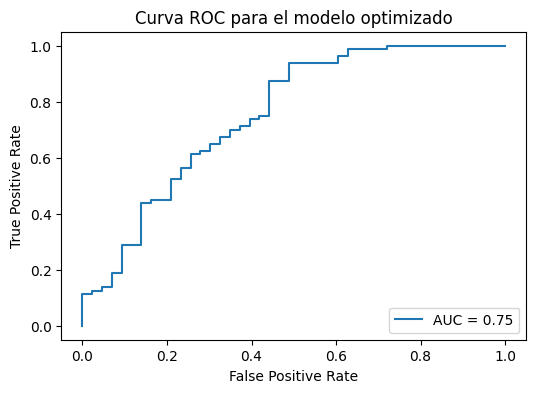

In [31]:
# Graficar la curva ROC del modelo optimizado
fpr, tpr, _ = roc_curve(y_test, y_pred_proba_optimized)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc_optimized:.2f}")
plt.title("Curva ROC para el modelo optimizado")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.show()
